In [2]:
import matplotlib.pyplot as plt
import strauss
from strauss.sonification import Sonification
from strauss import channels
from strauss.generator import Sampler
from strauss.score import Score
from strauss.generator import Synthesizer
import IPython.display as ipd
from strauss.sources import Events
import os
from scipy.interpolate import interp1d
import numpy as np
import copy
import wavio as wav

import matplotlib.pyplot as plt
from PIL import Image
import numpy as np
import time
from mike_code import LaguerreAmplitudes
from functionalities import *
import matplotlib.cm as cm
from skimage.transform import resize_local_mean
from combine_sonifications import combine_save_sonifications

import time

from FLEX_ed import ExpandGalaxies, BeefIt


import ffmpeg
import glob

# images from here:
spirals:

https://esahubble.org/images/heic0506a/

https://esahubble.org/images/heic0602a/

https://esahubble.org/images/potw2006a/

barred spiral:

https://esahubble.org/images/heic0910s/

elliptical:

https://esahubble.org/images/potw1921a/


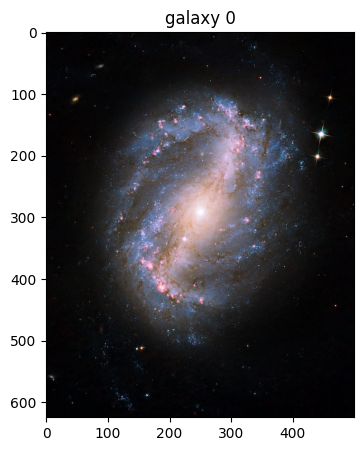

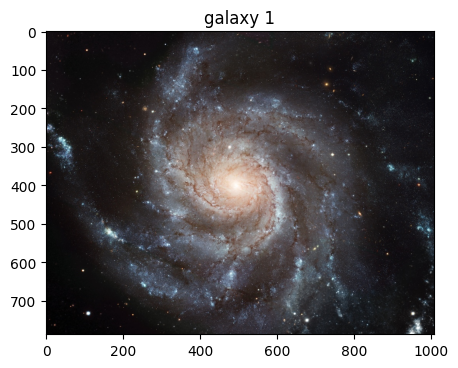

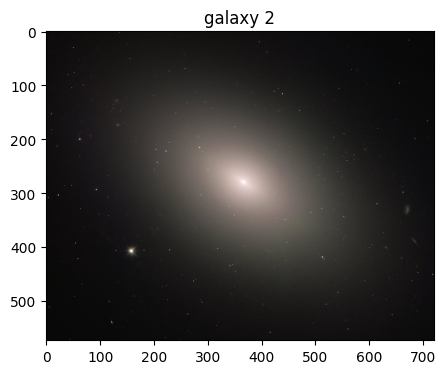

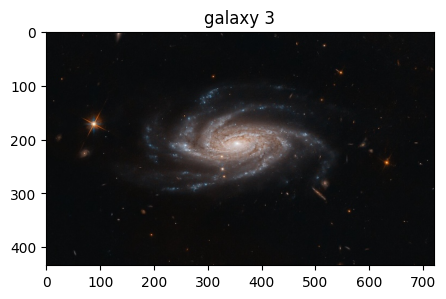

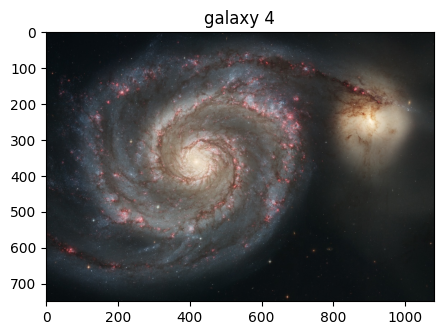

In [3]:
im_list = glob.glob('../sonification/hst_highres/lower_res/*')
for i in range(len(im_list)):
    av_image = np.asarray(Image.open(im_list[i]))
    fig, (ax) = plt.subplots(1,1, figsize=(5,5))
    ax.imshow(av_image)
    ax.set(title='galaxy '+str(i))

In [15]:
im_list

['../sonification/hst_highres/lower_res/ngc6217.jpg',
 '../sonification/hst_highres/lower_res/m101.jpg',
 '../sonification/hst_highres/lower_res/m57.jpg',
 '../sonification/hst_highres/lower_res/ngc2008.jpg',
 '../sonification/hst_highres/lower_res/m51.jpg']

opening image
Reff =  147.06534964487363  Galaxy Radius:  882.3920978692418
getting pixel info, galaxy radius, mask, etc
finding center of image
center of mass estimate -0.7826097230336915 -27.59482508451872
center finding iteration 0
center finding iteration 50
Center of mass at x = -0.7632493180616153, y = -28.181175573059978
finding best rscl
New rscl value: 90
updating to new_mmax, new_nmax


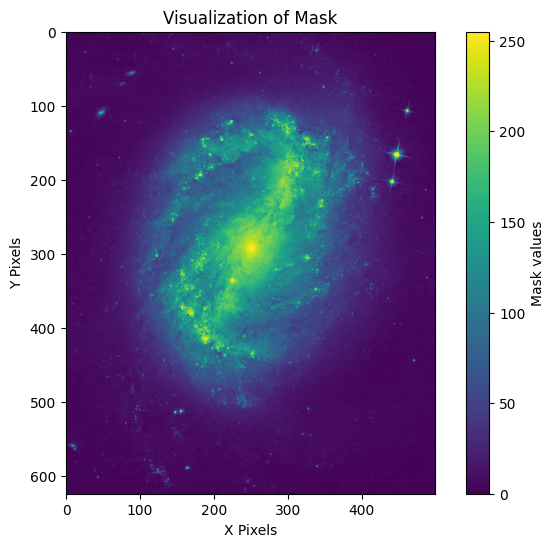

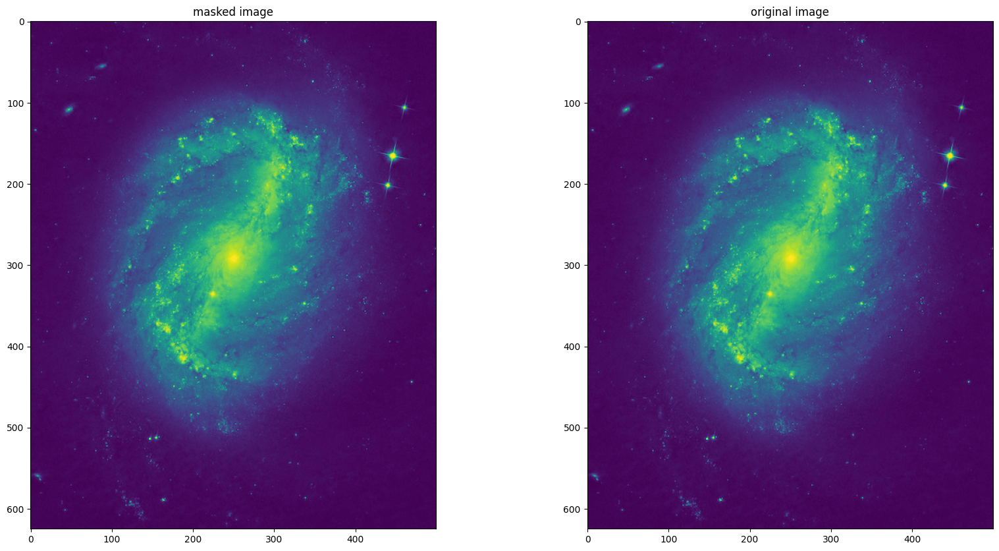

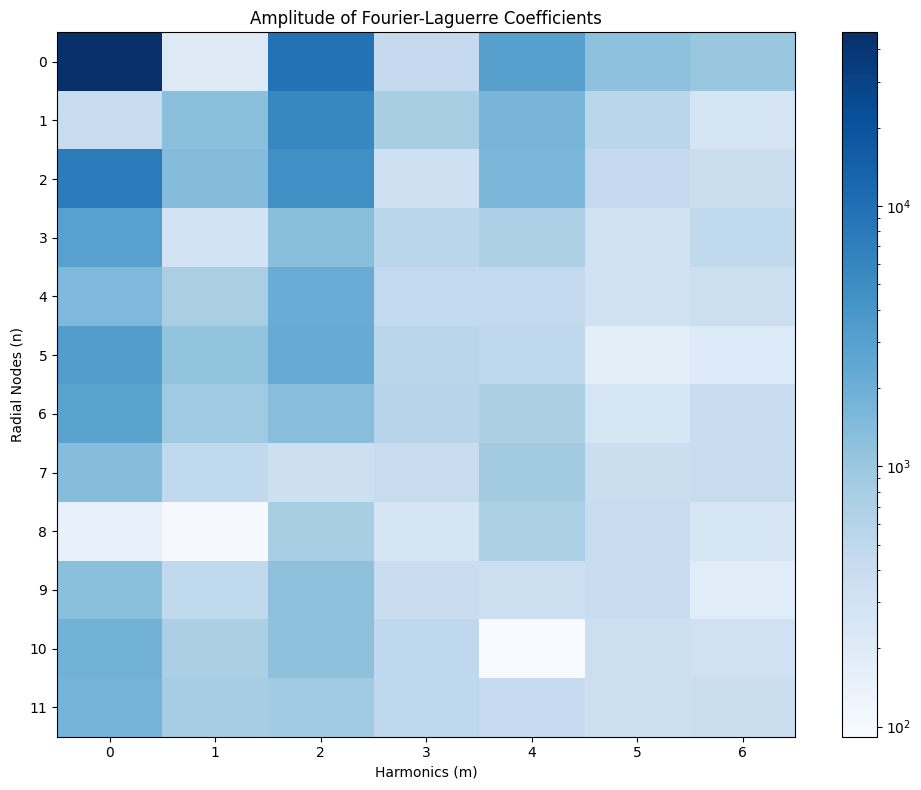

/Users/cfilion/Developer/sonification/FLEX_ed.py:721: RuntimeWarning: divide by zero encountered in divide
  ax3.imshow(((reconstruction - fixed_image) / fixed_image).T,cmap='bwr',vmin=-1,vmax=1)


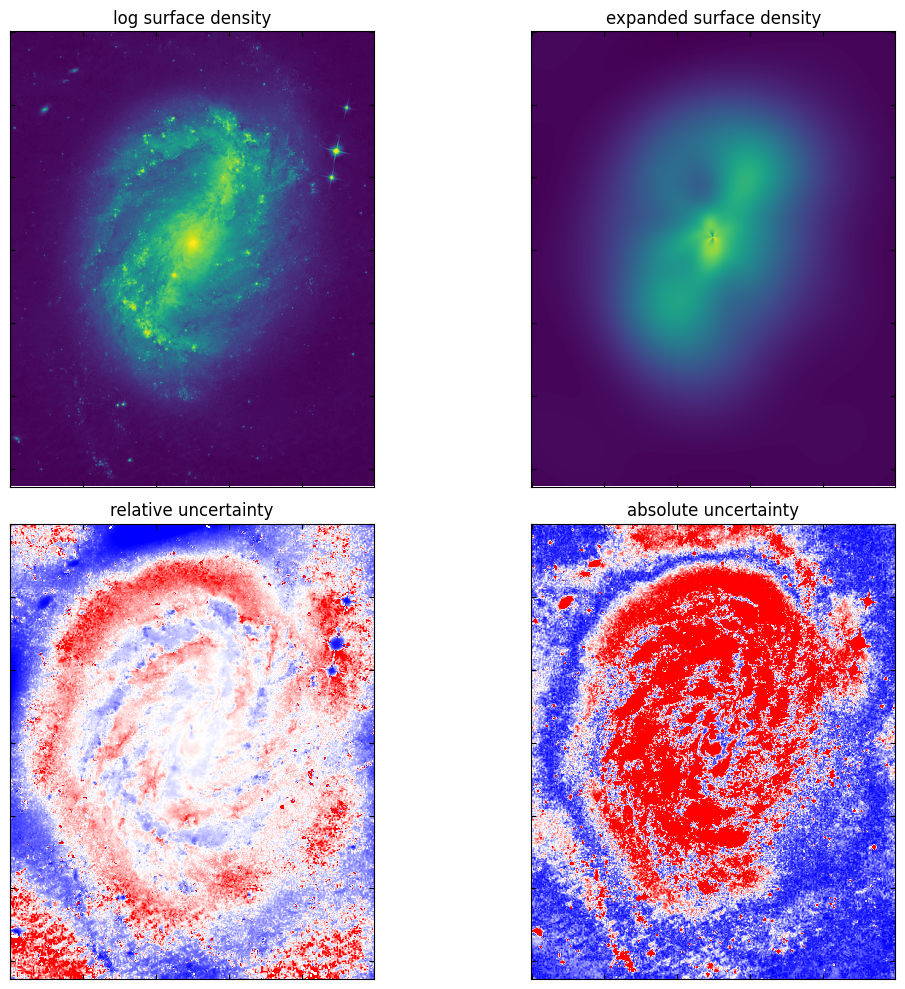

returning cosine coefficients, sine coefficients
opening image
Reff =  213.54768541306663  Galaxy Radius:  1281.2861124784
getting pixel info, galaxy radius, mask, etc
finding center of image
center of mass estimate 6.026479728212943 18.2330170780136
center finding iteration 0
center finding iteration 50
center finding iteration 100
center finding iteration 150
center finding iteration 200
center finding iteration 250
center finding iteration 300
center finding iteration 350
center finding iteration 400
center finding iteration 450
center finding iteration 500
center finding iteration 550
center finding iteration 600
center finding iteration 650
center finding iteration 700
center finding iteration 750
center finding iteration 800
center finding iteration 850
center finding iteration 900
center finding iteration 950
Center of mass at x = -12.275737235167544, y = 0.45138348318672783
finding best rscl
New rscl value: 173
updating to new_mmax, new_nmax


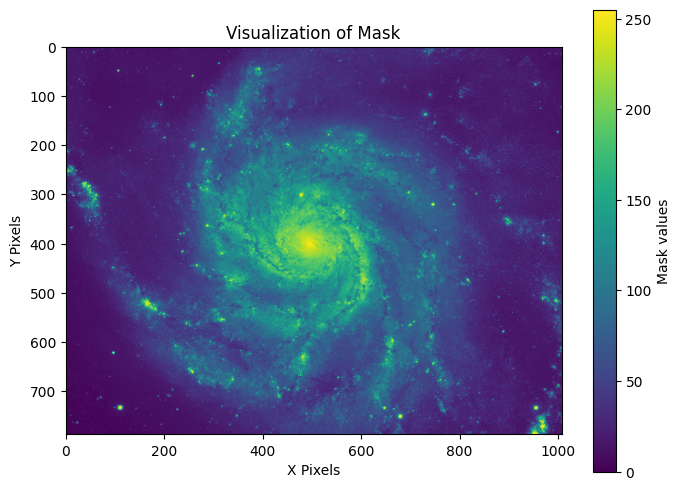

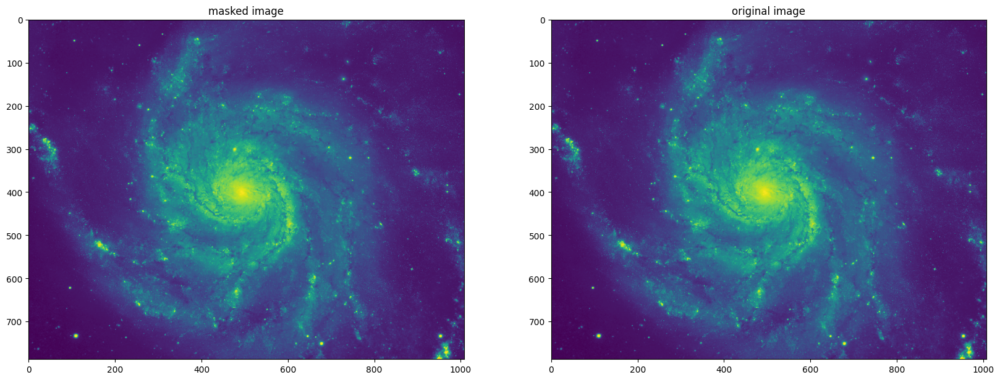

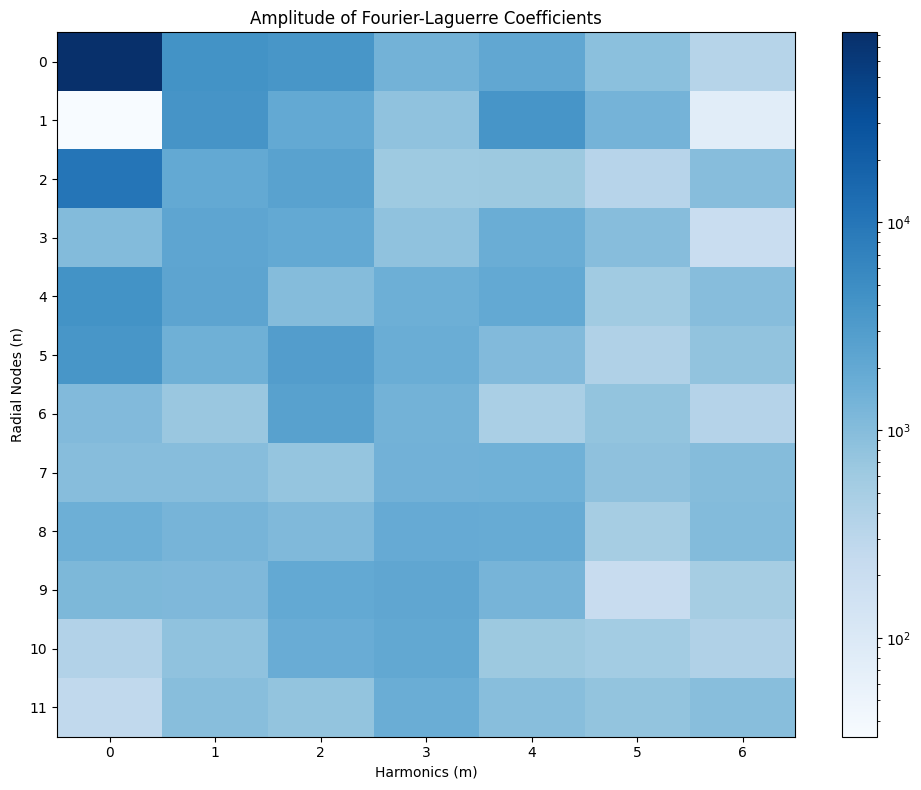

/Users/cfilion/Developer/sonification/FLEX_ed.py:721: RuntimeWarning: divide by zero encountered in divide
  ax3.imshow(((reconstruction - fixed_image) / fixed_image).T,cmap='bwr',vmin=-1,vmax=1)


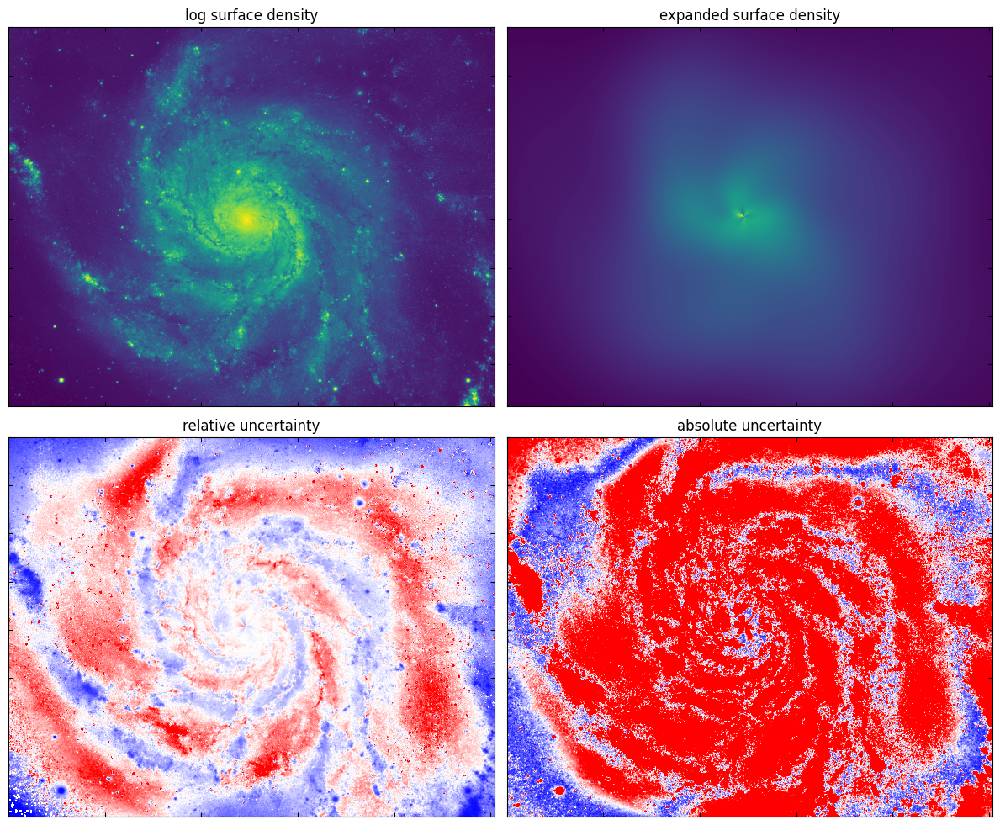

returning cosine coefficients, sine coefficients
opening image
Reff =  99.12159490767188  Galaxy Radius:  594.7295694460313
getting pixel info, galaxy radius, mask, etc
finding center of image
center of mass estimate 3.4931202927250884 -3.3370315133893165
center finding iteration 0
center finding iteration 50
center finding iteration 100
center finding iteration 150
center finding iteration 200
center finding iteration 250
center finding iteration 300
center finding iteration 350
center finding iteration 400
center finding iteration 450
center finding iteration 500
center finding iteration 550
center finding iteration 600
center finding iteration 650
center finding iteration 700
center finding iteration 750
center finding iteration 800
center finding iteration 850
center finding iteration 900
center finding iteration 950
Center of mass at x = 6.63502410896222, y = -5.928752841103442
finding best rscl
New rscl value: 109
updating to new_mmax, new_nmax


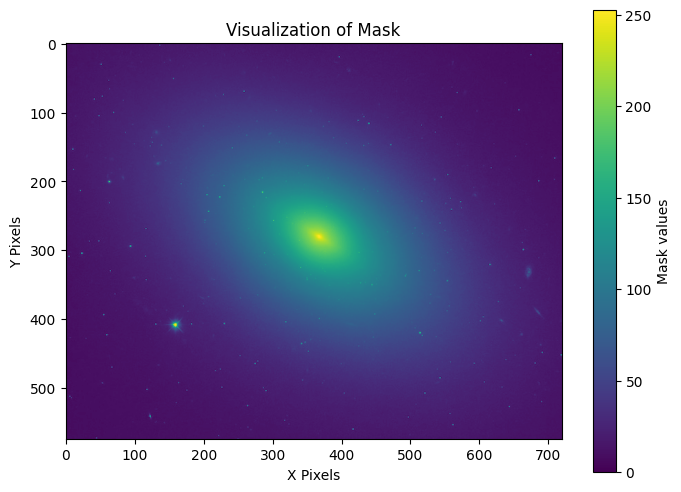

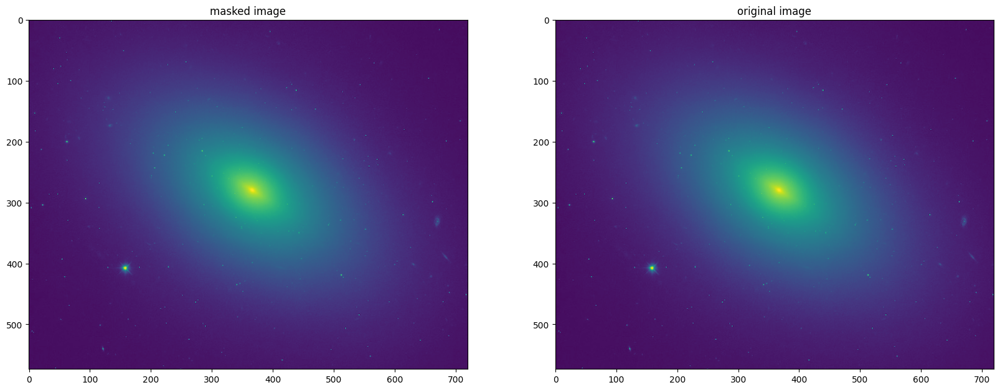

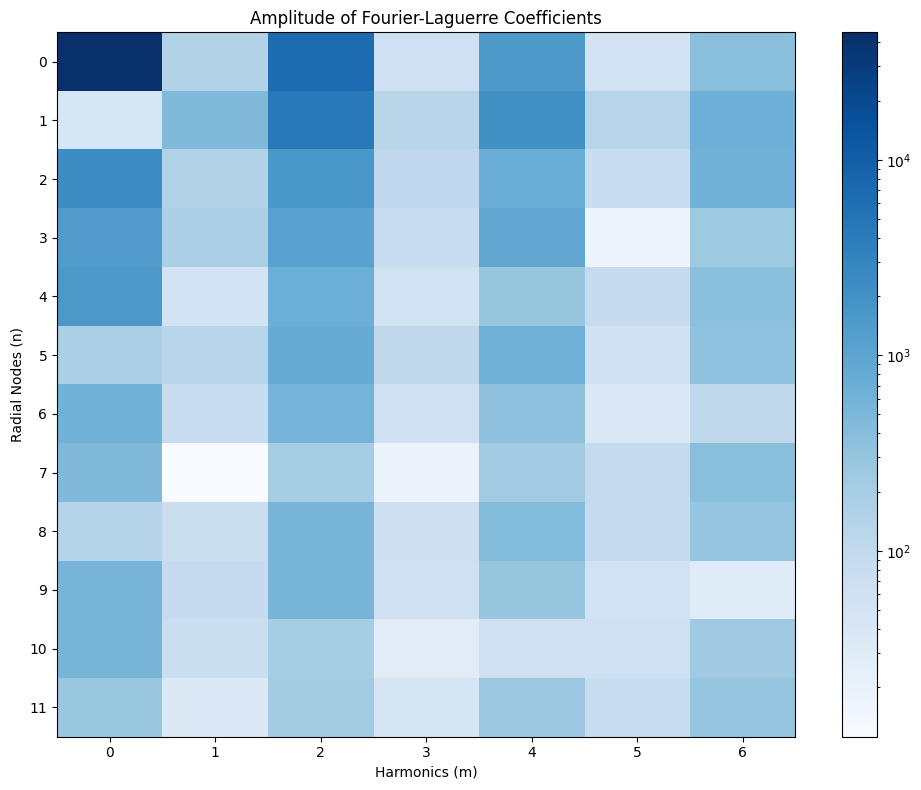

/Users/cfilion/Developer/sonification/FLEX_ed.py:721: RuntimeWarning: divide by zero encountered in divide
  ax3.imshow(((reconstruction - fixed_image) / fixed_image).T,cmap='bwr',vmin=-1,vmax=1)


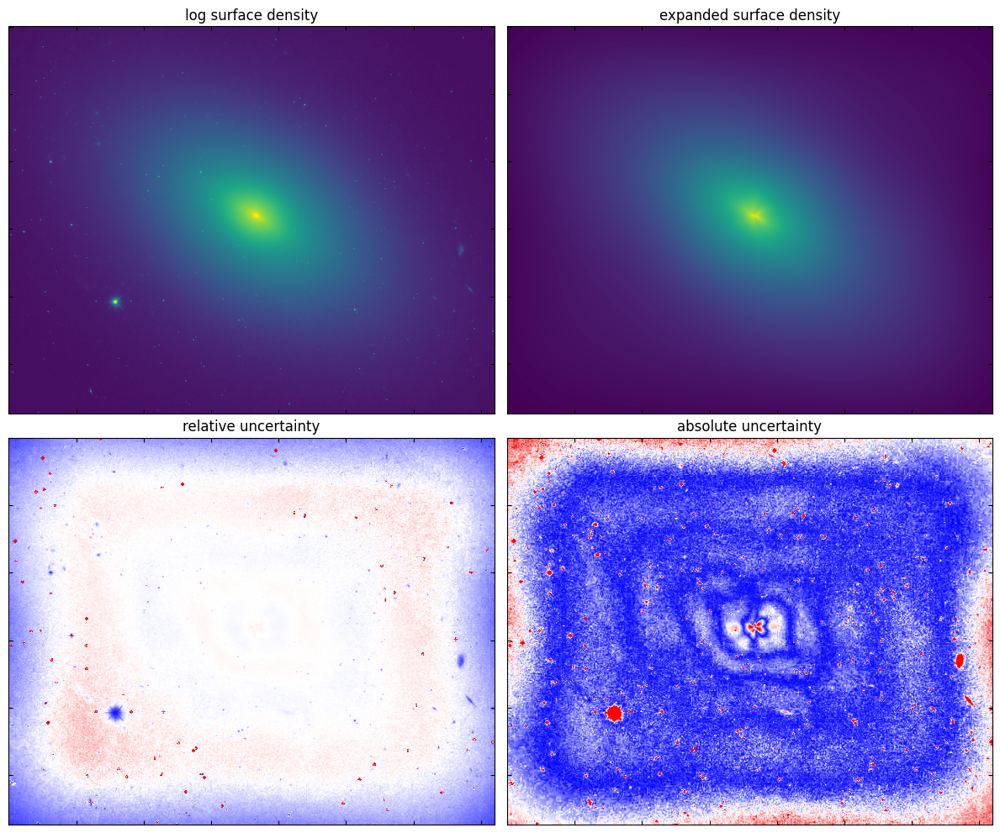

returning cosine coefficients, sine coefficients
opening image
Reff =  23.37819036069822  Galaxy Radius:  140.2691421641893
getting pixel info, galaxy radius, mask, etc
finding center of image
center of mass estimate -6.522855476904906 40.40802027429572
center finding iteration 0
center finding iteration 50
center finding iteration 100
center finding iteration 150
center finding iteration 200
center finding iteration 250
center finding iteration 300
center finding iteration 350
center finding iteration 400
center finding iteration 450
center finding iteration 500
center finding iteration 550
center finding iteration 600
center finding iteration 650
center finding iteration 700
center finding iteration 750
center finding iteration 800
center finding iteration 850
center finding iteration 900
center finding iteration 950
Center of mass at x = -4.7234985870643955, y = 31.850618624819163
finding best rscl
New rscl value: 34
updating to new_mmax, new_nmax


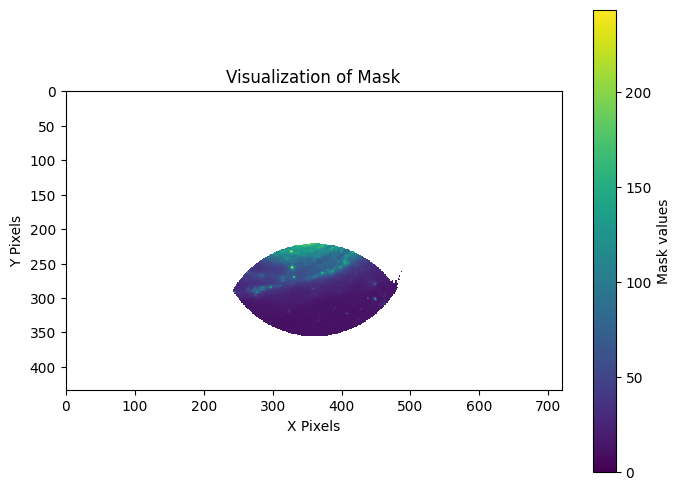

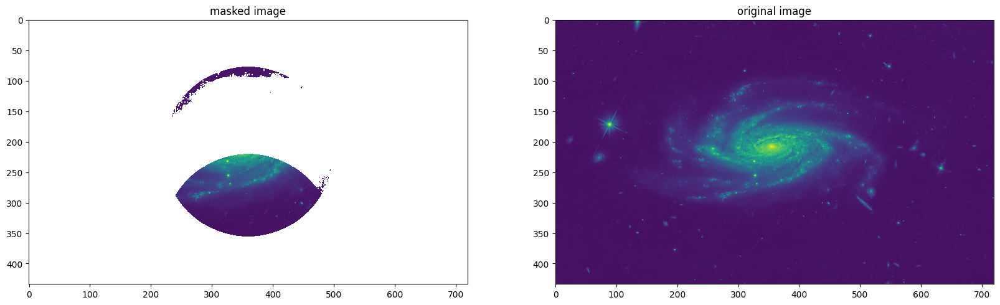

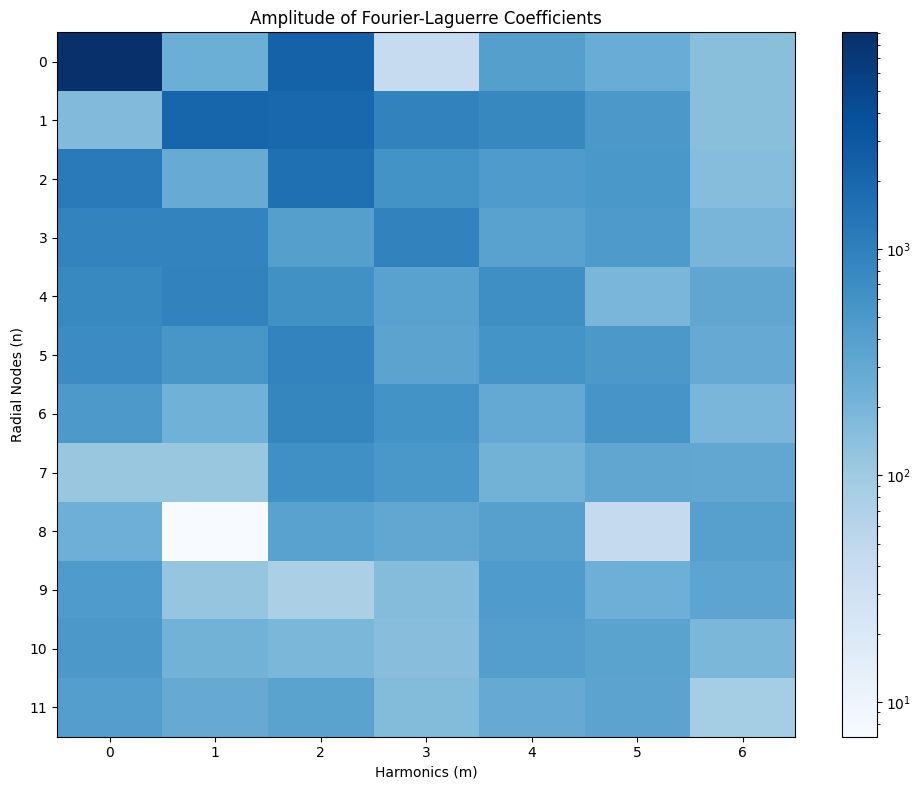

/Users/cfilion/Developer/sonification/FLEX_ed.py:721: RuntimeWarning: divide by zero encountered in divide
  ax3.imshow(((reconstruction - fixed_image) / fixed_image).T,cmap='bwr',vmin=-1,vmax=1)


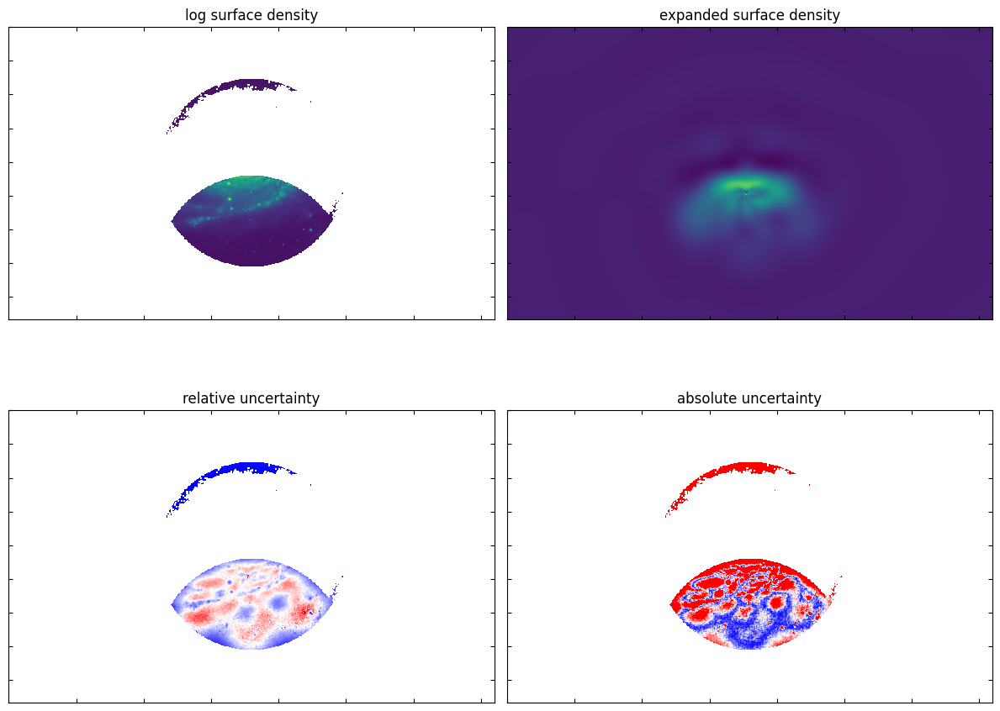

returning cosine coefficients, sine coefficients
opening image
Reff =  422.36789132516463  Galaxy Radius:  2534.2073479509877
getting pixel info, galaxy radius, mask, etc
finding center of image
center of mass estimate -15.755666639673066 -25.53443397268286
center finding iteration 0
center finding iteration 50
center finding iteration 100
center finding iteration 150
center finding iteration 200
center finding iteration 250
center finding iteration 300
center finding iteration 350
center finding iteration 400
center finding iteration 450
center finding iteration 500
center finding iteration 550
center finding iteration 600
center finding iteration 650
center finding iteration 700
center finding iteration 750
center finding iteration 800
center finding iteration 850
center finding iteration 900
center finding iteration 950
Center of mass at x = -14.50867091722553, y = -62.24838195444529
finding best rscl
New rscl value: 218
updating to new_mmax, new_nmax


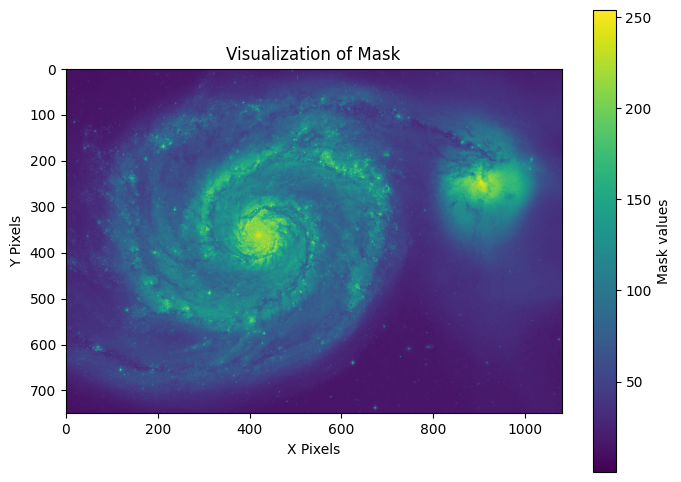

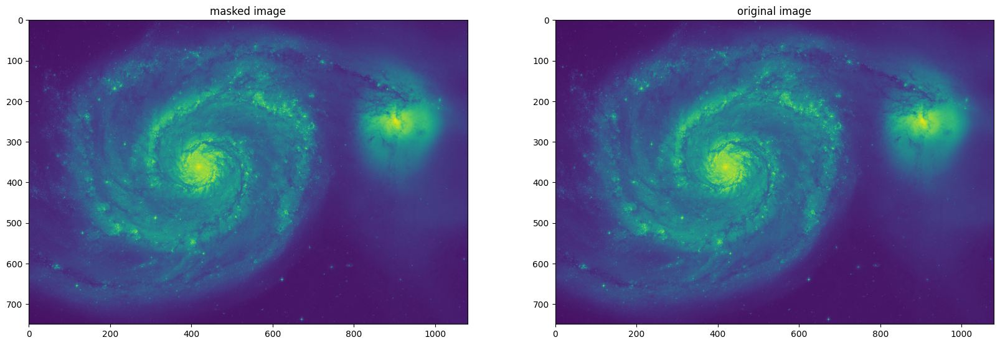

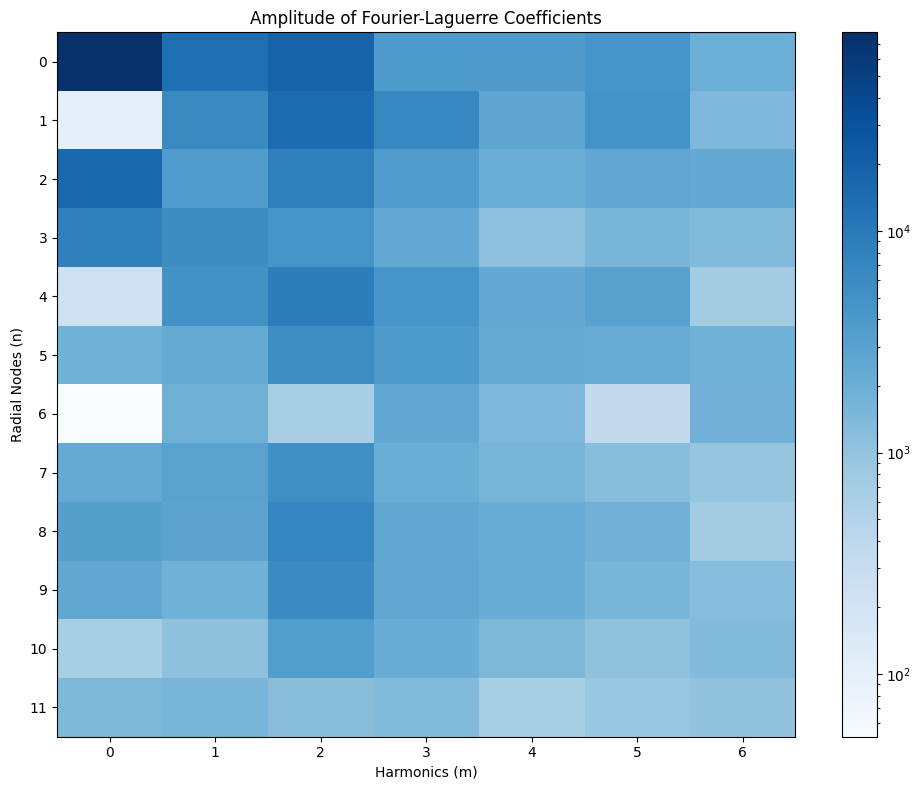

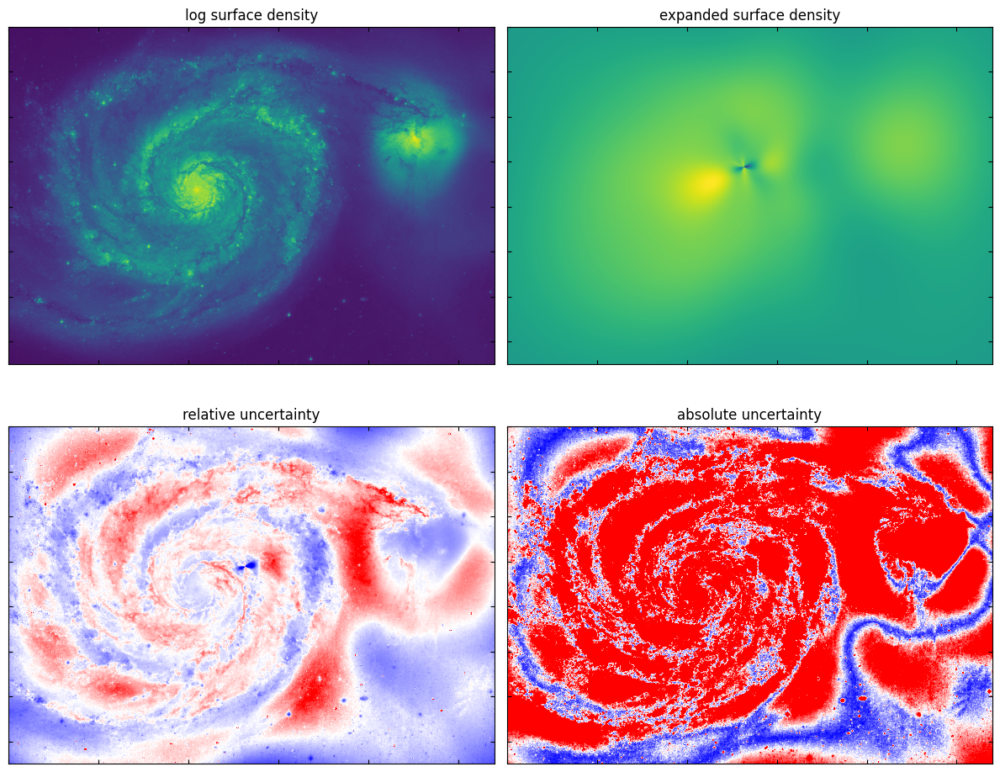

returning cosine coefficients, sine coefficients


In [4]:
coefs = {}
name_list = []
for image in im_list:
    cos_cos712, sin_cos712 = BeefIt(image, rscl_initial = 10, 
                                        mmax_initial = 2, nmax_initial = 10,
                                       new_mmax = 7, new_nmax = 12)
    i_ = image.split('.jpg')[0]
    name = i_.split('hst_highres/lower_res/')[1]
    name_list.append(name)
    coefs[name+'_sine'] = sin_cos712
    coefs[name+'_cosine'] = cos_cos712

In [5]:
test2 = Sampler("op1 synth 8.sf2", sf_preset=0)
test2_generator = copy.copy(test2)

In [6]:
def mod_map_to_sounds_octave_ampcutoff(cos_cos, sin_cos):
    note_list = np.array(['D#','A#','F','C','G', 'D', 'A', 'E','B','F#','C#','G#'])
    #np.array(['C', 'C#', 'D', 'D#', 'E', 'F', 'F#', 'G', 'G#', 'A', 'A#', 'B']) 
    #option one from Mike's overleaf - c, c#, d, d#, e, f, f#, g, g#, a, a#, b. chromatic scale
    mmax = cos_cos.shape[0]
    nmax = cos_cos.shape[1]

    modulus = np.sqrt(cos_cos**2 + sin_cos**2)
    
    abs_max = np.max(modulus)
    note_dict = {}
    
    for m in range(mmax):
        octave = m + 1 #hmm. running into issues that there are only some notes at m = 0 and m = 8... 
        #can kinda avoid bc last few terms are usually low amplitude but not really a fix here...
        for n in range(nmax):
            amp = modulus[m,n]/modulus[0,0]
            if abs(amp) >= 0.01*abs_max/modulus[0,0]: #will only play terms with amplitude at least 1% of max
                note = note_list[n] + str(octave)
                note_dict[note] = abs(amp)

    print('returning full set of notes')
    return note_dict

In [7]:
length = 2
for image in name_list:
    sin_cos = coefs[image+'_sine']
    cos_cos = coefs[image+'_cosine']
    note_dict = mod_map_to_sounds_octave_ampcutoff(cos_cos, sin_cos)
    score =  Score([list(note_dict.keys())], length)
    data = {'pitch': np.ones(len(note_dict.keys())),
           'volume': np.ones(len(note_dict.keys()))} #eventually want to make volume scale with importance somehow
    sources = Events(data.keys())
    sources.fromdict(data)
    lims = {'time': ('0','101')}
    sources.apply_mapping_functions(map_lims=lims)
    
    system = "mono"
    soni = Sonification(score, sources, test2_generator, system)
    soni.render()
    
    soni.hear() 
    soni.save(str(image)+'_synth1.wav')

returning full set of notes


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████| 49/49 [00:00<00:00, 558.96it/s]

Playing Sonification (2 s): 


Saved ngc6217_synth1.wav
returning full set of notes


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████| 56/56 [00:00<00:00, 504.24it/s]

Playing Sonification (2 s): 


Saved m101_synth1.wav
returning full set of notes


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████| 25/25 [00:00<00:00, 298.46it/s]

Playing Sonification (2 s): 


Saved m57_synth1.wav
returning full set of notes


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████| 79/79 [00:00<00:00, 496.75it/s]

Playing Sonification (2 s): 


Saved ngc2008_synth1.wav
returning full set of notes


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████| 75/75 [00:00<00:00, 544.49it/s]

Playing Sonification (2 s): 


Saved m51_synth1.wav


# New synth - 

In [8]:
generator = Sampler('ChateauGrand-Plus-Instruments-bs16i-v4.sf2')

valid 'sf_preset' not provided for soundfont file, available presets are:

----------------------------------------
1. "Rotary Organ"
2. "Warm Pad"
3. "Steel Guitar"
4. "Nylon Guitar"
5. "Chateau Grand"
6. "Chateau Grand+Pad"
7. "Ch Grand+LowStrings"
8. "Ch Grand+Strings"
9. "Ch Grand+ChamberStr"
10. "Full Strings Vel"
11. "Chamber Strings"
12. "Cello"
13. "Rotary Slow"
14. "Rotary Fast"
15. "Rotary Var.Velocity"
16. "Small Pipe Organ"
17. "Pipe Organ Full"
18. "Plein-jeu Organ Lge"
19. "DX7 EP"
20. "Small Plein-Jeu"
21. "Flute Sml Plein-Jeu"
22. "Pad Plein-jeu Large"
23. "Flute 2"
24. "FlutePad S Plein-Jeu"
25. "Dark Chateau Grand"
26. "DX7+Pad"
27. "DX7+Low Strings"
28. "Voyager-8"
29. "Violin (all around)"
30. "Two Violins"
31. "Alto Sax"
32. "Flute Expr+8 (SSO)"
33. "Clean Guitar"
34. "Jazz Guitar"
35. "Chorus Guitar"
36. "Trumpet"
37. "Synth Strings"
38. "Full Orchestra"
39. "Banjo 5 String"
40. "Moog Pad"
41. "Moog 55 Rez"
42. "Accordion"
43. "Italian Accordion"
44. "12 String Gu

In [9]:
generator = Sampler('ChateauGrand-Plus-Instruments-bs16i-v4.sf2', sf_preset = 75) #38
gen1 = copy.copy(generator)

In [10]:
length = 2
for image in name_list:
    sin_cos = coefs[image+'_sine']
    cos_cos = coefs[image+'_cosine']
    note_dict = mod_map_to_sounds_octave_ampcutoff(cos_cos, sin_cos)
    score =  Score([list(note_dict.keys())], length)
    data = {'pitch': np.ones(len(note_dict.keys())),
           'volume': np.ones(len(note_dict.keys()))} #eventually want to make volume scale with importance somehow
    sources = Events(data.keys())
    sources.fromdict(data)
    lims = {'time': ('0','101')}
    sources.apply_mapping_functions(map_lims=lims)
    
    system = "mono"
    soni = Sonification(score, sources, gen1, system)
    soni.render()
    
    soni.hear() 
    soni.save(str(image)+'_inst1.wav')



returning full set of notes


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████| 49/49 [00:00<00:00, 480.71it/s]

Playing Sonification (2 s): 


Saved ngc6217_inst1.wav
returning full set of notes


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████| 56/56 [00:00<00:00, 439.61it/s]

Playing Sonification (2 s): 


Saved m101_inst1.wav
returning full set of notes


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████| 25/25 [00:00<00:00, 563.28it/s]

Playing Sonification (2 s): 


Saved m57_inst1.wav
returning full set of notes


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████| 79/79 [00:00<00:00, 505.50it/s]

Playing Sonification (2 s): 


Saved ngc2008_inst1.wav
returning full set of notes


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████| 75/75 [00:00<00:00, 622.62it/s]

Playing Sonification (2 s): 


Saved m51_inst1.wav


# new instrument

In [11]:
generator = Sampler('ChateauGrand-Plus-Instruments-bs16i-v4.sf2', sf_preset = 25) #38
gen2 = copy.copy(generator)

In [12]:
length = 2
for image in name_list:
    sin_cos = coefs[image+'_sine']
    cos_cos = coefs[image+'_cosine']
    note_dict = mod_map_to_sounds_octave_ampcutoff(cos_cos, sin_cos)
    score =  Score([list(note_dict.keys())], length)
    data = {'pitch': np.ones(len(note_dict.keys())),
           'volume': np.ones(len(note_dict.keys()))} #eventually want to make volume scale with importance somehow
    sources = Events(data.keys())
    sources.fromdict(data)
    lims = {'time': ('0','101')}
    sources.apply_mapping_functions(map_lims=lims)
    
    system = "mono"
    soni = Sonification(score, sources, gen2, system)
    soni.render()
    
    soni.hear() 
    soni.save(str(image)+'_inst2.wav')

returning full set of notes


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████| 49/49 [00:00<00:00, 803.70it/s]

Playing Sonification (2 s): 


Saved ngc6217_inst2.wav
returning full set of notes


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████| 56/56 [00:00<00:00, 659.51it/s]

Playing Sonification (2 s): 


Saved m101_inst2.wav
returning full set of notes


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████| 25/25 [00:00<00:00, 633.89it/s]

Playing Sonification (2 s): 


Saved m57_inst2.wav
returning full set of notes


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████| 79/79 [00:00<00:00, 679.31it/s]

Playing Sonification (2 s): 


Saved ngc2008_inst2.wav
returning full set of notes


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████| 75/75 [00:00<00:00, 665.52it/s]

Playing Sonification (2 s): 


Saved m51_inst2.wav


# New generator - 

In [13]:
test = Sampler("op1_synth8_try2.sf2", sf_preset=0)
test_generator = copy.copy(test)

In [14]:
length = 3
for image in name_list:
    sin_cos = coefs[image+'_sine']
    cos_cos = coefs[image+'_cosine']
    note_dict = mod_map_to_sounds_octave_ampcutoff(cos_cos, sin_cos)
    score =  Score([list(note_dict.keys())], length)
    print(note_dict)
    data = {'pitch': np.ones(len(note_dict.keys())),
           'volume': np.ones(len(note_dict.keys()))} #eventually want to make volume scale with importance somehow
    sources = Events(data.keys())
    sources.fromdict(data)
    lims = {'time': ('0','101')}
    sources.apply_mapping_functions(map_lims=lims)
    
    system = "mono"
    soni = Sonification(score, sources, test_generator, system)
    soni.render()
    
    soni.hear() 
    soni.save(str(image)+'synth2.wav')

returning full set of notes
{'D#1': np.float64(1.0), 'F1': np.float64(0.16024149989375286), 'C1': np.float64(0.06277199508298205), 'G1': np.float64(0.03284993884695673), 'D1': np.float64(0.06891749343734914), 'A1': np.float64(0.059455896628491406), 'E1': np.float64(0.029259222760493392), 'F#1': np.float64(0.027126292263351618), 'C#1': np.float64(0.0385772293985699), 'G#1': np.float64(0.03779781794603928), 'A#2': np.float64(0.026745263130733412), 'F2': np.float64(0.029507134262001623), 'G2': np.float64(0.01631716565646424), 'D2': np.float64(0.02364627213404211), 'A2': np.float64(0.01971467689404931), 'E2': np.float64(0.010287328962607844), 'F#2': np.float64(0.01018161661577066), 'C#2': np.float64(0.01585576769580527), 'G#2': np.float64(0.0172815382229277), 'D#3': np.float64(0.20355330629815796), 'A#3': np.float64(0.1258270166200284), 'F3': np.float64(0.100642547724387), 'C3': np.float64(0.027672722447340294), 'G3': np.float64(0.045685196721432265), 'D3': np.float64(0.04730759930479272),

100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████| 49/49 [00:00<00:00, 375.12it/s]

Playing Sonification (3 s): 


Saved ngc6217synth2.wav
returning full set of notes
{'D#1': np.float64(1.0), 'F1': np.float64(0.12224239251980619), 'C1': np.float64(0.012417471159586886), 'G1': np.float64(0.051450537165387555), 'D1': np.float64(0.045174399569361735), 'A1': np.float64(0.012935638520211578), 'E1': np.float64(0.011769724513338048), 'B1': np.float64(0.019233209384987328), 'F#1': np.float64(0.014086726020542492), 'D#2': np.float64(0.05108778485253407), 'A#2': np.float64(0.047860493496930986), 'F2': np.float64(0.024204563228239388), 'C2': np.float64(0.02691328316189228), 'G2': np.float64(0.028213160562053977), 'D2': np.float64(0.018945872997849056), 'E2': np.float64(0.011768632245884812), 'B2': np.float64(0.016005063432827833), 'F#2': np.float64(0.013894109070402363), 'G#2': np.float64(0.011384893386453916), 'D#3': np.float64(0.04531740697470701), 'A#3': np.float64(0.02388719320982351), 'F3': np.float64(0.030835390423736495), 'C3': np.float64(0.024118857365236984), 'G3': np.float64(0.01211773056327255), 'D

100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████| 56/56 [00:00<00:00, 323.53it/s]

Playing Sonification (3 s): 


Saved m101synth2.wav
returning full set of notes
{'D#1': np.float64(1.0), 'F1': np.float64(0.05144785202361011), 'C1': np.float64(0.029658283193967433), 'G1': np.float64(0.03506191010043797), 'A1': np.float64(0.014174159701205918), 'E1': np.float64(0.010175441752934465), 'F#1': np.float64(0.012323541074227045), 'C#1': np.float64(0.012590822139255671), 'A#2': np.float64(0.010276925070895981), 'D#3': np.float64(0.14733061862990585), 'A#3': np.float64(0.09684056162255876), 'F3': np.float64(0.03653920981790338), 'C3': np.float64(0.024353498796303063), 'G3': np.float64(0.01566465617576222), 'D3': np.float64(0.017154907972346506), 'A3': np.float64(0.0127174813752344), 'B3': np.float64(0.012263125577152955), 'F#3': np.float64(0.012404672792120146), 'D#5': np.float64(0.033767192066989825), 'A#5': np.float64(0.045863725611314465), 'F5': np.float64(0.01621171906498259), 'C5': np.float64(0.020080281802945323), 'D5': np.float64(0.014770339174857141), 'A#7': np.float64(0.014860782113302145), 'F7': 

100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████| 25/25 [00:00<00:00, 301.57it/s]

Playing Sonification (3 s): 


Saved m57synth2.wav
returning full set of notes
{'D#1': np.float64(1.0), 'A#1': np.float64(0.01858266809254943), 'F1': np.float64(0.12817795351862463), 'C1': np.float64(0.0982244358426899), 'G1': np.float64(0.08622943210245981), 'D1': np.float64(0.08005995163894178), 'A1': np.float64(0.054247727257713936), 'E1': np.float64(0.01255193936786336), 'B1': np.float64(0.02704768244071788), 'F#1': np.float64(0.05065484329247713), 'C#1': np.float64(0.05514699371822489), 'G#1': np.float64(0.045779685649825964), 'D#2': np.float64(0.027247260401979435), 'A#2': np.float64(0.2298225881770233), 'F2': np.float64(0.0301454336442952), 'C2': np.float64(0.10050509881457143), 'G2': np.float64(0.10348017589554305), 'D2': np.float64(0.05803554489575648), 'A2': np.float64(0.025362059536222097), 'E2': np.float64(0.012696250562896506), 'F#2': np.float64(0.013280029841295017), 'C#2': np.float64(0.02358191271011473), 'G#2': np.float64(0.03091731762889536), 'D#3': np.float64(0.25278226671589016), 'A#3': np.float64

100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████| 79/79 [00:00<00:00, 326.83it/s]


Playing Sonification (3 s): 
Saved ngc2008synth2.wav
returning full set of notes
{'D#1': np.float64(1.0), 'F1': np.float64(0.20461085144797556), 'C1': np.float64(0.10418143650958252), 'D1': np.float64(0.02322765537065177), 'E1': np.float64(0.028994776805224682), 'B1': np.float64(0.04117178571105177), 'F#1': np.float64(0.03154502485950027), 'G#1': np.float64(0.01828802868828082), 'D#2': np.float64(0.1662058691052389), 'A#2': np.float64(0.07872632021103473), 'F2': np.float64(0.04444539279208535), 'C2': np.float64(0.07334172149092577), 'G2': np.float64(0.06282811179839885), 'D2': np.float64(0.02952616073074783), 'A2': np.float64(0.024100667635282624), 'E2': np.float64(0.03731425286156932), 'B2': np.float64(0.03556265031399321), 'F#2': np.float64(0.022986893839099198), 'C#2': np.float64(0.013618784722666063), 'G#2': np.float64(0.02022598768516841), 'D#3': np.float64(0.23372746865521585), 'A#3': np.float64(0.1829222877164637), 'F3': np.float64(0.10555256248345814), 'C3': np.float64(0.059426

100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████| 75/75 [00:00<00:00, 443.12it/s]

Playing Sonification (3 s): 


Saved m51synth2.wav


In [60]:
np.sqrt(coefs['heic0611b_66_sine']**2+coefs['heic0611b_66_cosine']**2)/np.sqrt(coefs['heic0611b_66_sine']**2+coefs['heic0611b_66_cosine']**2)[0][0]

array([[1.        , 0.01546844, 0.0686697 , 0.03807817, 0.04855625,
        0.06518692, 0.03106414, 0.00275442, 0.00257995, 0.01938115,
        0.03408229, 0.0369925 ],
       [0.03182679, 0.05449246, 0.04698471, 0.01743926, 0.03488762,
        0.02618995, 0.01754621, 0.04187296, 0.04685041, 0.03516791,
        0.01910054, 0.00815146],
       [0.24744339, 0.15553567, 0.04792246, 0.0291306 , 0.06925175,
        0.05004098, 0.00998292, 0.02749129, 0.0218784 , 0.00703195,
        0.01706234, 0.01701377],
       [0.06879043, 0.04954216, 0.06216329, 0.05435969, 0.07357813,
        0.0759734 , 0.07729811, 0.06464996, 0.04129543, 0.02402093,
        0.01639573, 0.0080597 ],
       [0.10256315, 0.15483807, 0.19469253, 0.13578272, 0.09442221,
        0.08527743, 0.08217709, 0.0680762 , 0.04508586, 0.02138397,
        0.00267634, 0.0175285 ],
       [0.07894245, 0.0900227 , 0.07061359, 0.05895817, 0.05725893,
        0.0518478 , 0.03596541, 0.01847426, 0.01505951, 0.02159801,
        0.02786749,

In [67]:
cc = np.sqrt(coefs['heic0611b_66_sine']**2+coefs['heic0611b_66_cosine']**2)/np.sqrt(coefs['heic0611b_66_sine']**2+\
                                                                                    coefs['heic0611b_66_cosine']**2)[0][0]
cb = np.sqrt(coefs['heic0611b_66_sine']**2+coefs['heic0611b_66_cosine']**2)
cc[(cc>.01)].shape, cb[(cb>cb[0][0]*.01)].shape

((76,), (76,))

In [13]:
# ok starting with cc, which is easiest bc just mapping to octaves
length = 1.5 #3 seconds
i = -1
for note_set in data_list:
    i+=1
    score =  Score([list(note_set.keys())], length)
    
    data = {'pitch': np.ones(len(note_set.keys())),
           'volume': np.ones(len(note_set.keys()))} #eventually want to make volume scale with importance somehow
    sources = Events(data.keys())
    sources.fromdict(data)
    lims = {'time': ('0','101')}
    sources.apply_mapping_functions(map_lims=lims)
    
    system = "stereo"
    soni = Sonification(score, sources, test2_generator, system)
    soni.render()
    
    soni.hear() 
    soni.save(str(name_list[i])+'.wav')

'../sonification/HubbleDeepSpace/heic0611b_66'